In [1]:
import datetime
import missingno as msno
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt

In [3]:
full_df = pd.read_csv("../data/zonal-means-aggregate-200910-201912.csv")
full_df

,location_period_id,year,month,lst_3,lst_2,lst_1,lst_0,precip_3,precip_2,precip_1,precip_0,sm_3,sm_2,sm_1,sm_0,outbreak
0,92,2010,1,32.357544,33.726624,34.437530,35.159393,288.192780,61.916030,2.243044,0.277970,75.846150,55.673077,25.692308,11.038462,0
1,92,2010,2,33.726624,34.437530,35.159393,37.299316,61.916030,2.243044,0.277970,0.205065,55.673077,25.692308,11.038462,5.673077,0
2,92,2010,3,34.437530,35.159393,37.299316,37.331665,2.243044,0.277970,0.205065,0.414880,25.692308,11.038462,5.673077,1.826923,0
3,92,2010,4,35.159393,37.299316,37.331665,39.188446,0.277970,0.205065,0.414880,6.336623,11.038462,5.673077,1.826923,1.634615,0
4,92,2010,5,37.299316,37.331665,39.188446,38.275238,0.205065,0.414880,6.336623,106.946400,5.673077,1.826923,1.634615,23.211538,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57634,16697,2019,8,39.427277,41.711395,29.873108,28.330505,146.727780,308.896500,312.504060,310.206630,63.965520,90.206894,89.000000,85.183910,0
57635,16697,2019,9,41.711395,29.873108,28.330505,32.087708,308.896500,312.504060,310.206630,243.551130,90.206894,89.000000,85.183910,68.770120,0
57636,16697,2019,10,29.873108,28.330505,32.087708,28.918060,312.504060,310.206630,243.551130,207.554380,89.000000,85.183910,68.770120,50.137930,0
57637,16697,2019,11,28.330505,32.087708,28.918060,29.032227,310.206630,243.551130,207.554380,92.452390,85.183910,68.770120,50.137930,44.494250,0


In [4]:
# create new date column from month and year, assign arbitrary day value of 1
full_df["date"] = pd.to_datetime(full_df[["year", "month"]].assign(Day=1))
full_df

,location_period_id,year,month,lst_3,lst_2,lst_1,lst_0,precip_3,precip_2,precip_1,precip_0,sm_3,sm_2,sm_1,sm_0,outbreak,date
0,92,2010,1,32.357544,33.726624,34.437530,35.159393,288.192780,61.916030,2.243044,0.277970,75.846150,55.673077,25.692308,11.038462,0,2010-01-01
1,92,2010,2,33.726624,34.437530,35.159393,37.299316,61.916030,2.243044,0.277970,0.205065,55.673077,25.692308,11.038462,5.673077,0,2010-02-01
2,92,2010,3,34.437530,35.159393,37.299316,37.331665,2.243044,0.277970,0.205065,0.414880,25.692308,11.038462,5.673077,1.826923,0,2010-03-01
3,92,2010,4,35.159393,37.299316,37.331665,39.188446,0.277970,0.205065,0.414880,6.336623,11.038462,5.673077,1.826923,1.634615,0,2010-04-01
4,92,2010,5,37.299316,37.331665,39.188446,38.275238,0.205065,0.414880,6.336623,106.946400,5.673077,1.826923,1.634615,23.211538,0,2010-05-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57634,16697,2019,8,39.427277,41.711395,29.873108,28.330505,146.727780,308.896500,312.504060,310.206630,63.965520,90.206894,89.000000,85.183910,0,2019-08-01
57635,16697,2019,9,41.711395,29.873108,28.330505,32.087708,308.896500,312.504060,310.206630,243.551130,90.206894,89.000000,85.183910,68.770120,0,2019-09-01
57636,16697,2019,10,29.873108,28.330505,32.087708,28.918060,312.504060,310.206630,243.551130,207.554380,89.000000,85.183910,68.770120,50.137930,0,2019-10-01
57637,16697,2019,11,28.330505,32.087708,28.918060,29.032227,310.206630,243.551130,207.554380,92.452390,85.183910,68.770120,50.137930,44.494250,0,2019-11-01


# Exploring the extent of missing data across all feature variables 

Let's explore the entire dataset for missing observations: 
missing_values = full_df.isna()
missing_values

In [5]:
missing_values = full_df.isna()
missing_values

,location_period_id,year,month,lst_3,lst_2,lst_1,lst_0,precip_3,precip_2,precip_1,precip_0,sm_3,sm_2,sm_1,sm_0,outbreak,date
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57634,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
57635,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
57636,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
57637,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


Now let's explore some of the missing data using the `missingno` correlation heatmap which measures nullity correlation (in other words, how strongly the presence or absence of one variable affects the presence of another). See the `missingno` [github repo]https://github.com/ResidentMario/missingno) for further documentation. Values range from `-1` (means one variable is present and another most definitely is not) to `0` (presence of variables have no effect on one another) to `1` (indicating that if one variable appears the other variable is definitely also present). 

In the heatmap below, we see there really isn't a relationship between any of the variables, with the presence/absence of `sm` and `precip` observations only slightly positively correlated. In summary, no significant findings observed here. 

<Axes: >

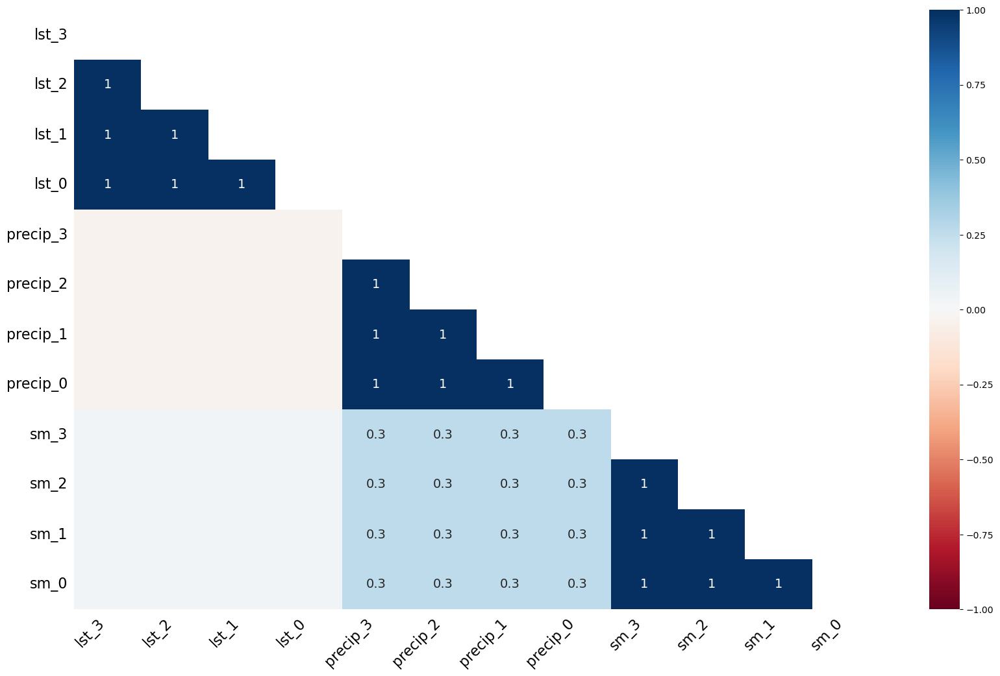

In [6]:
msno.heatmap(full_df)

Using the `missingno` barchart option, we get a breakdown of the extent of missing data for each of the variables. The `LST` dataset is the fullest, with `precip` containing slightly fewer, and the `sm` dataset missing the biggest chunk of observations. Keep in mind each of the trailing month observations (e.g., lst_1, lst_2, etc) are the same `lst_0` dataset, just offset by a month prior, two months prior, etc. 

<Axes: >

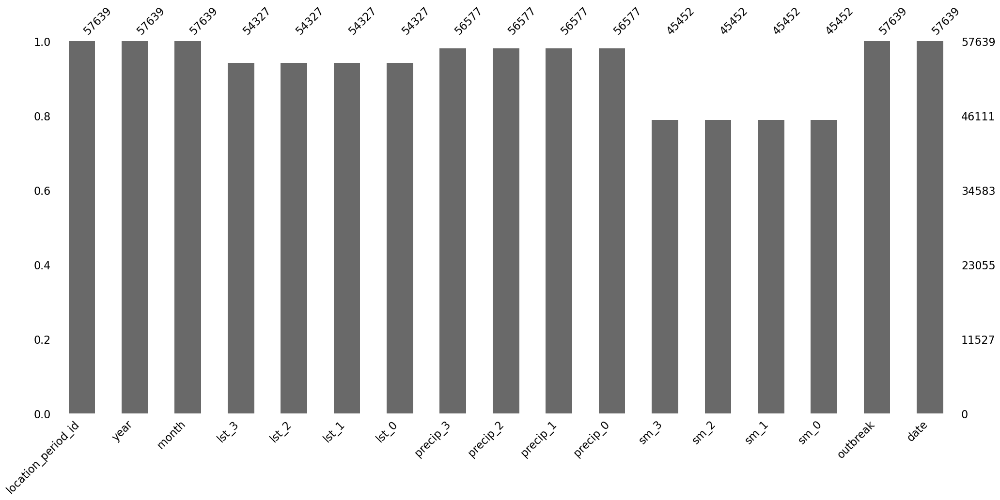

In [7]:
msno.bar(full_df)

Let's see if we can get a better idea of how large these gaps in observations over time are

In [8]:
# according to the docs, if we are working with time series data we should be able to
# specify a periodicity using the `freq` keyword parameter but this line of code does
# not yet function properly

# msno.matrix(full_df.set_index(pd.period_range("2009-01-01", "2019-12-01", freq="M")))

Let's first explore the distribution of the `lst_0` observations

It is important to keep in mind when viewing the distribution of LST values, that there is a difference between land-surface temperature (LST) and air temperature. Air temperature, which we read in weather forecasts, is a measure of how hot the air is above ground. Alternatively, LST is a measure of how hot the actual surface feels to touch. [See ESA reference](https://www.esa.int/ESA_Multimedia/Images/2023/07/Temperature_of_the_surface_of_the_land_17_July_2023#:~:text=It%20is%20worth%20noting%20the,surface%20feels%20to%20the%20touch).

In [9]:
lst_0_ts = px.scatter(full_df, x="date", y="lst_0")
lst_0_ts.show()

/opt/homebrew/Caskroom/miniforge/base/envs/geo-ds-cholera/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


In [10]:
print("Total number of missing lst_0 values are: ")
full_df["lst_0"].isna().sum()

Total number of missing lst_0 values are: 


3312

# Exploring a variety of imputation methods for missing data

* forward fill [using pandas](https://pandas.pydata.org/docs/user_guide/missing_data.html)
* backward fill [using pandas](https://pandas.pydata.org/docs/user_guide/missing_data.html)

From `Pandas` missing data [docs](https://pandas.pydata.org/docs/user_guide/missing_data.html): 
There are currently two available filling methods:
| Method | Action |
|--------|--------|
|pad / ffill|Fill values forward|
|pad / backfill|Fill values backward|

With time series data, using pad/ffill is extremely common so that the “last known value” is available at every time point.
- ffill() is equivalent to fillna(method='ffill') and bfill() is equivalent to fillna(method='bfill')



## Land surface temperature

In [11]:
# forward fill
ffill_imputed = full_df.copy(deep=True)
ffill_imputed.ffill(inplace=True)

In [31]:
# backward fill
bfill_imputed = full_df.copy(deep=True)
bfill_imputed.bfill(inplace=True)

<Axes: title={'center': 'LST Forward Fill'}>

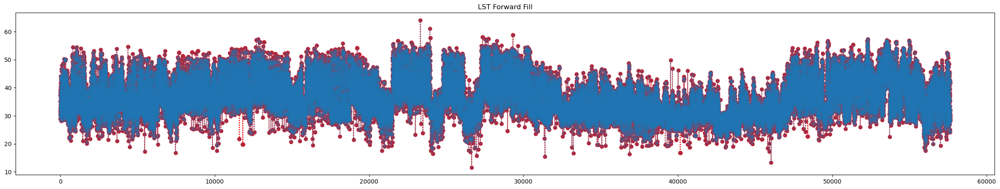

In [35]:
ffill_imputed["lst_0"].plot(
    color="red",
    marker="o",
    linestyle="dotted",
    figsize=(30, 5),
)

full_df["lst_0"].plot(title="LST Forward Fill", marker="o", figsize=(30, 5), alpha=0.3)

<Axes: title={'center': 'LST Back Fill'}>

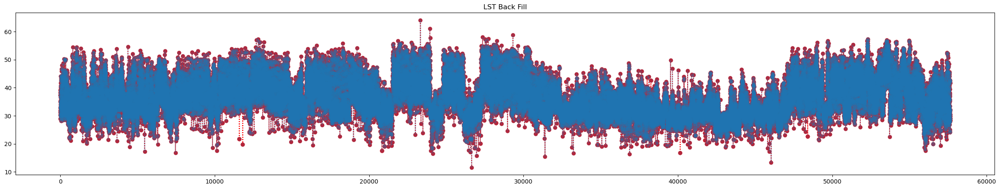

In [36]:
bfill_imputed["lst_0"].plot(
    color="red",
    marker="o",
    linestyle="dotted",
    figsize=(30, 5),
)

full_df["lst_0"].plot(title="LST Back Fill", marker="o", figsize=(30, 5), alpha=0.3)

## Precipitation

Now, we'll explore the distribution of the `precip_0` observations

In [13]:
precip_0_ts = px.scatter(full_df, x="date", y="precip_0")
precip_0_ts.show()

/opt/homebrew/Caskroom/miniforge/base/envs/geo-ds-cholera/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [14]:
missing_values_precip = full_df["precip_0"].isna().sum()
print(missing_values_precip)

1062


<Axes: title={'center': 'Precip Forward Fill'}>

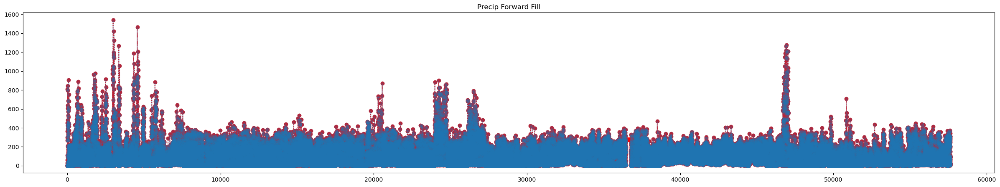

In [37]:
ffill_imputed["precip_0"].plot(
    color="red", marker="o", linestyle="dotted", figsize=(30, 5)
)
full_df["precip_0"].plot(
    title="Precip Forward Fill", marker="o", figsize=(30, 5), alpha=0.3
)

<Axes: title={'center': 'Precip Backward Fill'}>

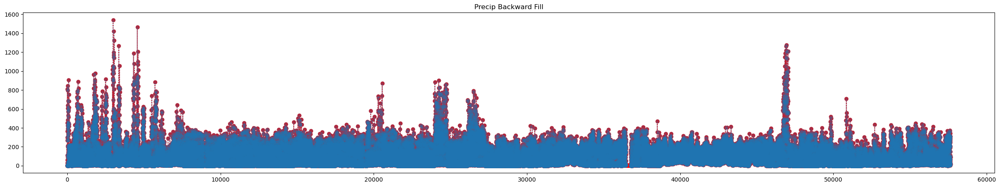

In [38]:
bfill_imputed["precip_0"].plot(
    color="red",
    marker="o",
    linestyle="dotted",
    figsize=(30, 5),
)

full_df["precip_0"].plot(
    title="Precip Backward Fill", marker="o", figsize=(30, 5), alpha=0.3
)

Finally, we'll explore the distribution of the `sm_0` observations

In [15]:
sm_0_ts = px.scatter(full_df, x="date", y="sm_0")
sm_0_ts.show()

/opt/homebrew/Caskroom/miniforge/base/envs/geo-ds-cholera/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



<Axes: title={'center': 'SM Forward Fill'}>

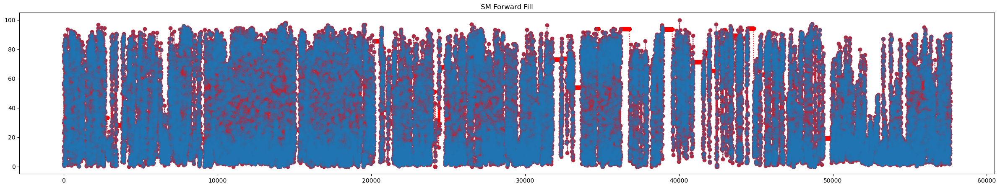

In [39]:
ffill_imputed["sm_0"].plot(color="red", marker="o", linestyle="dotted", figsize=(30, 5))
full_df["sm_0"].plot(title="SM Forward Fill", marker="o", figsize=(30, 5), alpha=0.3)

<Axes: title={'center': 'SM Backward Fill'}>

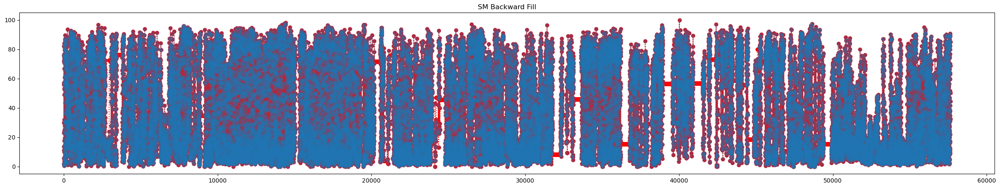

In [42]:
bfill_imputed["sm_0"].plot(color="red", marker="o", linestyle="dotted", figsize=(30, 5))
full_df["sm_0"].plot(title="SM Backward Fill", marker="o", figsize=(30, 5), alpha=0.3)